# Importing

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, DepthwiseConv2D
from tensorflow.keras.layers import Conv2D, BatchNormalization
from tensorflow.keras.layers import ReLU, Flatten, Dense

# Data

In [46]:
data = tf.keras.utils.image_dataset_from_directory('Train 2', image_size=(128, 128), batch_size=45)

Found 640658 files belonging to 1000 classes.


In [47]:
test = tf.keras.utils.image_dataset_from_directory('Test', image_size=(128, 128), batch_size=45)

Found 50000 files belonging to 1000 classes.


In [48]:
data_iterator = data.as_numpy_iterator()
test_iterator = test.as_numpy_iterator()

In [49]:
test_iterator

In [50]:
train_batch = data_iterator.next()
test_batch = test_iterator.next()

In [51]:
train_batch[0].shape

(45, 128, 128, 3)

In [52]:
train_batch[1]

array([343, 928, 722, 344, 705, 515, 947, 612, 521, 191, 789, 408, 666,
       550, 203, 393, 928, 363, 108, 559, 361, 442, 900,  46,  14,  72,
       267, 283, 852, 579, 321, 209, 417, 235, 687, 480, 185, 524, 455,
       664, 691, 932, 514, 781, 850])

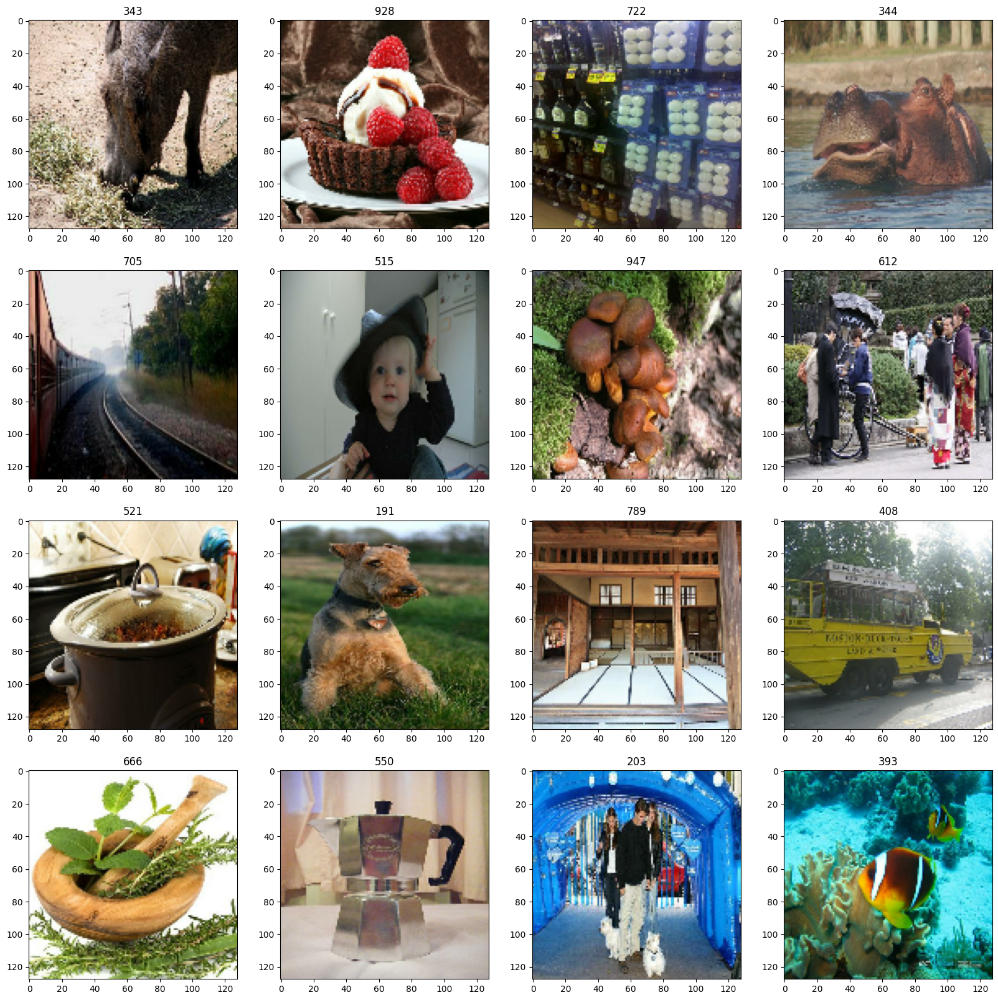

In [53]:
fig, ax = plt.subplots(ncols=4, nrows=4, figsize=(20, 20))
ax = ax.flatten()
for idx, img in enumerate(train_batch[0][:16]):
    ax[idx].imshow(img.astype(int))
    ax[idx].title.set_text(train_batch[1][idx])

# Preprocessing Data

In [54]:
data = data.map(lambda x, y: (x/255, y))
test = test.map(lambda x, y: (x/255, y))

In [55]:
scaled_iterator = data.as_numpy_iterator()
test_scaled_iterator = test.as_numpy_iterator()

In [56]:
batch = scaled_iterator.next()
test_batch = test_scaled_iterator.next()

In [57]:
batch[0].max()

1.0

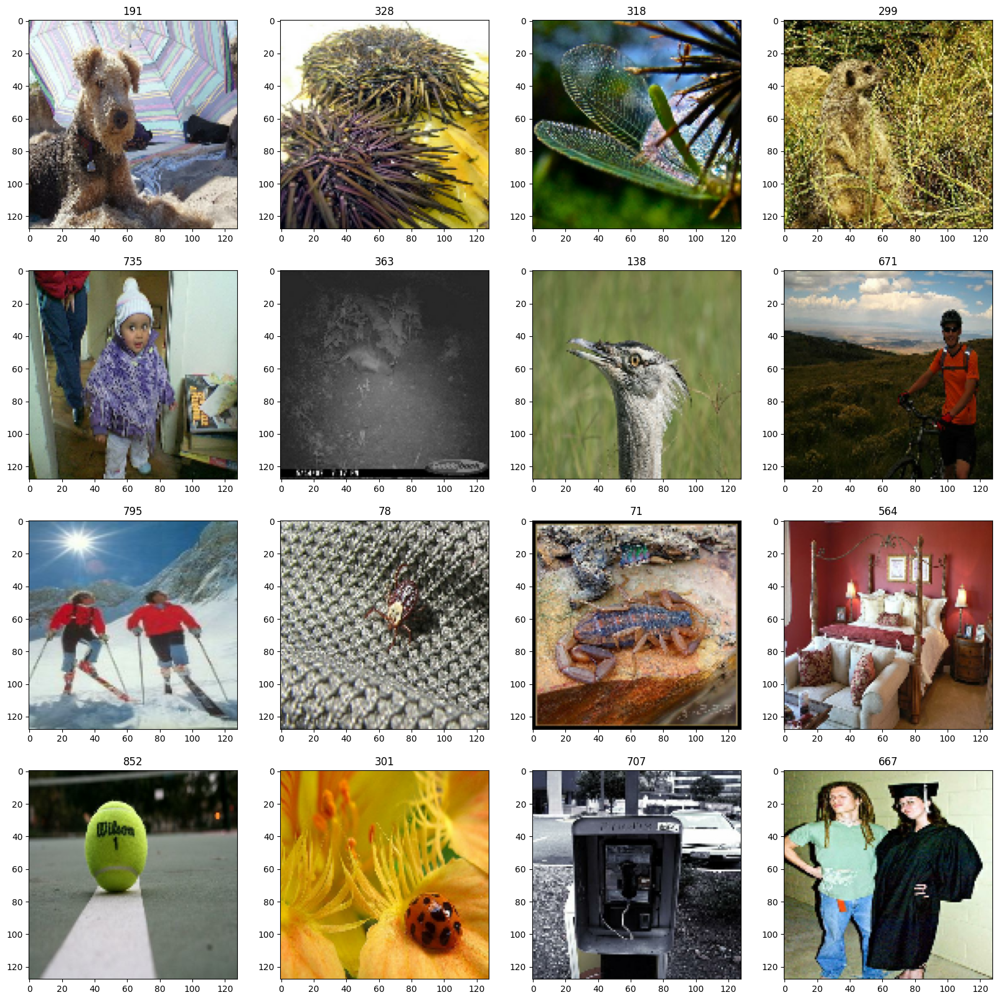

In [58]:
fig, ax = plt.subplots(ncols=4, nrows=4, figsize=(20, 20))
ax = ax.flatten()
for idx, img in enumerate(batch[0][:16]):
    ax[idx].imshow(img)
    ax[idx].title.set_text(batch[1][idx])

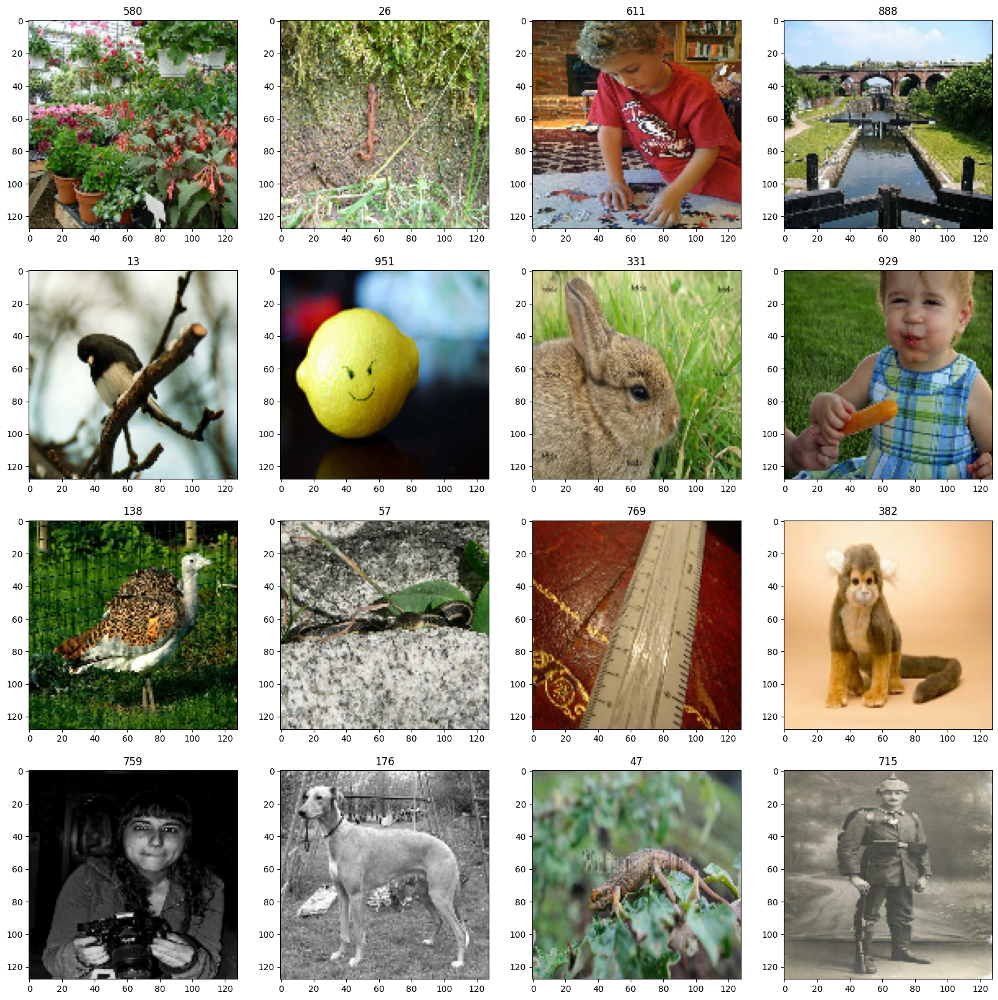

In [59]:
fig, ax = plt.subplots(ncols=4, nrows=4, figsize=(20, 20))
ax = ax.flatten()
for idx, img in enumerate(test_batch[0][:16]):
    ax[idx].imshow(img)
    ax[idx].title.set_text(test_batch[1][idx])

In [60]:
train_size = int(len(data) * 0.8)
val_size = len(data) - train_size

In [61]:
train_size

11389

In [62]:
val_size

2848

In [63]:
train = data.take(train_size)
val = data.skip(train_size).take(val_size)

# Model

In [20]:
from tensorflow.keras.applications import MobileNetV2

In [21]:
def mobilnet_block (x, filters, strides):
    
    x = DepthwiseConv2D(kernel_size = 3, strides = strides, padding = 'same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    
    x = Conv2D(filters = filters, kernel_size = 1, strides = 1)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    
    return x


input = Input(shape = (128,128,3))
x = Conv2D(filters = 32, kernel_size = 3, strides = 1, padding = 'same')(input)
x = BatchNormalization()(x)
x = ReLU()(x)

x = mobilnet_block(x, filters = 64, strides = 2)
x = mobilnet_block(x, filters = 128, strides = 1)
x = mobilnet_block(x, filters = 128, strides = 2)
x = mobilnet_block(x, filters = 256, strides = 2)
x = mobilnet_block(x, filters = 512, strides = 1)
x = mobilnet_block(x, filters = 512, strides = 2)
for _ in range (5):
    x = mobilnet_block(x, filters = 512, strides = 1)
x = mobilnet_block(x, filters = 1024, strides = 2)
x = mobilnet_block(x, filters = 1024, strides = 2)
# x = AvgPool2D ()(x)
x = Flatten()(x)
output = Dense (units = 1000, activation = 'softmax')(x)
model = Model(inputs=input, outputs=output)
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 128, 128, 32)     128       
 ormalization)                                                   
                                                                 
 re_lu (ReLU)                (None, 128, 128, 32)      0         
                                                                 
 depthwise_conv2d (Depthwise  (None, 64, 64, 32)       320       
 Conv2D)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 64, 64, 32)       128   

In [22]:
model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 128, 128, 32)     128       
 ormalization)                                                   
                                                                 
 re_lu (ReLU)                (None, 128, 128, 32)      0         
                                                                 
 depthwise_conv2d (Depthwise  (None, 64, 64, 32)       320       
 Conv2D)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 64, 64, 32)       128   

In [24]:
# Train Model
model.fit(train, validation_data=val, epochs=40)

Epoch 1/40
11389/11389 [==============================] - 1559s 137ms/step - loss: 5.4255 - accuracy: 0.0634 - val_loss: 4.8070 - val_accuracy: 0.1124
Epoch 2/40
11389/11389 [==============================] - 1528s 134ms/step - loss: 4.1445 - accuracy: 0.1820 - val_loss: 4.0171 - val_accuracy: 0.2028
Epoch 3/40
11389/11389 [==============================] - 1550s 136ms/step - loss: 3.6181 - accuracy: 0.2537 - val_loss: 3.7366 - val_accuracy: 0.2462
Epoch 4/40
11389/11389 [==============================] - 1540s 135ms/step - loss: 3.2599 - accuracy: 0.3070 - val_loss: 3.6986 - val_accuracy: 0.2792
Epoch 5/40
11389/11389 [==============================] - 1538s 135ms/step - loss: 2.9708 - accuracy: 0.3527 - val_loss: 3.4064 - val_accuracy: 0.2992
Epoch 6/40
11389/11389 [==============================] - 1539s 135ms/step - loss: 2.7758 - accuracy: 0.3852 - val_loss: 3.9302 - val_accuracy: 0.2901
Epoch 7/40
11389/11389 [==============================] - 1538s 135ms/step - loss: 2.5697 - ac

KeyboardInterrupt: 

In [27]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.0001, decay_steps=11389, decay_rate=0.9
)

model.compile(
    loss=tf.keras.losses.sparse_categorical_crossentropy,
    optimizer= tf.keras.optimizers.Adam(learning_rate=lr_schedule),
    metrics=[tf.keras.metrics.sparse_categorical_accuracy]
)
model.fit(train, validation_data=val, epochs=10)

Epoch 1/10
11389/11389 [==============================] - 1577s 138ms/step - loss: 2.1116 - sparse_categorical_accuracy: 0.5089 - val_loss: 4.1052 - val_sparse_categorical_accuracy: 0.3458
Epoch 2/10
11389/11389 [==============================] - 1550s 136ms/step - loss: 1.9339 - sparse_categorical_accuracy: 0.5442 - val_loss: 3.8145 - val_sparse_categorical_accuracy: 0.3513
Epoch 3/10
11389/11389 [==============================] - 1553s 136ms/step - loss: 1.8466 - sparse_categorical_accuracy: 0.5628 - val_loss: 3.6150 - val_sparse_categorical_accuracy: 0.3513
Epoch 4/10
11389/11389 [==============================] - 1542s 135ms/step - loss: 1.7812 - sparse_categorical_accuracy: 0.5753 - val_loss: 3.6487 - val_sparse_categorical_accuracy: 0.3522
Epoch 5/10
11389/11389 [==============================] - 1589s 140ms/step - loss: 1.7295 - sparse_categorical_accuracy: 0.5860 - val_loss: 3.8976 - val_sparse_categorical_accuracy: 0.3534
Epoch 6/10
11389/11389 [==============================]

In [26]:
model.evaluate(test)

1112/1112 [==============================] - 42s 37ms/step - loss: 3.8091 - sparse_categorical_accuracy: 0.2836


[3.809141159057617, 0.2836199998855591]

In [ ]:
prediction = model.predict(test)

array([[1.1729554e-04, 2.1507537e-06, 1.4491735e-06, ..., 1.6077308e-02,
        1.3024011e-04, 1.4502510e-07],
       [1.9791626e-04, 1.5368685e-06, 8.8518522e-05, ..., 2.8392701e-06,
        3.6289059e-06, 3.1635133e-04],
       [4.3469381e-08, 1.4407215e-07, 6.8744259e-07, ..., 5.5266014e-07,
        6.0233101e-06, 1.2824397e-09],
       ...,
       [3.9989282e-05, 1.9469046e-05, 3.6527810e-04, ..., 5.0231032e-05,
        2.3427347e-04, 1.0133603e-04],
       [5.8886584e-05, 3.6036231e-06, 3.2419854e-04, ..., 3.7000561e-04,
        1.5662476e-05, 3.0444122e-05],
       [1.7989896e-07, 1.8677121e-03, 3.6220084e-05, ..., 4.8963815e-05,
        3.3576764e-06, 1.0261691e-05]], dtype=float32)

In [ ]:
model.predict(test).argmax(-1)

array([565, 426, 568, ..., 904,  24,  71], dtype=int64)

In [28]:
model.save("my_model_2", save_format="tf")  # Saves model + optimizer state

INFO:tensorflow:Assets written to: my_model_2\assets


In [64]:
data_1 = tf.keras.utils.image_dataset_from_directory('Train 1', image_size=(128, 128), batch_size=45)

Found 639639 files belonging to 1000 classes.


In [65]:
data_iterator_1 = data_1.as_numpy_iterator()

In [66]:
train_batch_1 = data_iterator_1.next()

In [67]:
data_1 = data_1.map(lambda x, y: (x/255, y))

In [68]:
scaled_iterator_1 = data_1.as_numpy_iterator()

In [69]:
batch_1 = scaled_iterator_1.next()

In [70]:
train_size_1 = int(len(data_1) * 0.8)
val_size_1 = len(data_1) - train_size_1

In [71]:
train_1 = data_1.take(train_size_1)
val_1 = data_1.skip(train_size_1).take(val_size_1)

In [37]:

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.00005, decay_steps=23000, decay_rate=0.09
)

# Compile the model with RMSprop and scheduled learning rate
model.compile(
    loss=tf.keras.losses.sparse_categorical_crossentropy,
    optimizer= tf.keras.optimizers.Adam(learning_rate=lr_schedule),
    metrics=[tf.keras.metrics.sparse_categorical_accuracy]
)
model.fit(train_1, validation_data=val_1, epochs=20)

Epoch 1/20
11372/11372 [==============================] - 1574s 138ms/step - loss: 3.1838 - sparse_categorical_accuracy: 0.3368 - val_loss: 3.2331 - val_sparse_categorical_accuracy: 0.3563
Epoch 2/20
11372/11372 [==============================] - 1580s 139ms/step - loss: 3.0783 - sparse_categorical_accuracy: 0.3475 - val_loss: 3.2007 - val_sparse_categorical_accuracy: 0.3590
Epoch 3/20
11372/11372 [==============================] - 1583s 139ms/step - loss: 3.0584 - sparse_categorical_accuracy: 0.3512 - val_loss: 3.1782 - val_sparse_categorical_accuracy: 0.3597
Epoch 4/20
11372/11372 [==============================] - 1579s 139ms/step - loss: 3.0519 - sparse_categorical_accuracy: 0.3521 - val_loss: 3.1956 - val_sparse_categorical_accuracy: 0.3600
Epoch 5/20
11372/11372 [==============================] - 1575s 138ms/step - loss: 3.0504 - sparse_categorical_accuracy: 0.3520 - val_loss: 3.1785 - val_sparse_categorical_accuracy: 0.3601
Epoch 6/20
11372/11372 [==============================]

KeyboardInterrupt: 

In [ ]:
model.evaluate(test)

1112/1112 [==============================] - 51s 45ms/step - loss: 3.4405 - sparse_categorical_accuracy: 0.3329


[3.4404900074005127, 0.33292001485824585]

In [39]:
model.save("my_model_3", save_format="tf")  # Saves model + optimizer state

INFO:tensorflow:Assets written to: my_model_3\assets


In [30]:
model = tf.keras.models.load_model("my_model_3")

In [ ]:

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.0005, decay_steps=40000, decay_rate=0.09
)

model.compile(
    loss=tf.keras.losses.sparse_categorical_crossentropy,
    optimizer= tf.keras.optimizers.Adam(learning_rate=lr_schedule),
    metrics=[tf.keras.metrics.sparse_categorical_accuracy]
)
model.fit(train_1, validation_data=val_1, epochs=20)

Epoch 1/20
11372/11372 [==============================] - 1639s 143ms/step - loss: 3.0374 - sparse_categorical_accuracy: 0.3533 - val_loss: 2.9778 - val_sparse_categorical_accuracy: 0.3796
Epoch 2/20
11372/11372 [==============================] - 1598s 140ms/step - loss: 2.7179 - sparse_categorical_accuracy: 0.4068 - val_loss: 4.7176 - val_sparse_categorical_accuracy: 0.3918
Epoch 3/20
11372/11372 [==============================] - 1629s 143ms/step - loss: 2.5481 - sparse_categorical_accuracy: 0.4370 - val_loss: 3.8693 - val_sparse_categorical_accuracy: 0.3953
Epoch 4/20
11372/11372 [==============================] - 1632s 143ms/step - loss: 2.4741 - sparse_categorical_accuracy: 0.4506 - val_loss: 3.9935 - val_sparse_categorical_accuracy: 0.3966
Epoch 5/20
11372/11372 [==============================] - 1603s 141ms/step - loss: 2.4329 - sparse_categorical_accuracy: 0.4588 - val_loss: 4.1624 - val_sparse_categorical_accuracy: 0.3973
Epoch 6/20
11372/11372 [==============================]

KeyboardInterrupt: 

In [32]:
model.evaluate(test)

1112/1112 [==============================] - 41s 37ms/step - loss: 4.2121 - sparse_categorical_accuracy: 0.3669


[4.212084770202637, 0.3669399917125702]

In [34]:
model.save("my_model_4", save_format="tf")  # Saves model + optimizer state

INFO:tensorflow:Assets written to: my_model_4\assets


In [72]:
# Compile the model with RMSprop and scheduled learning rate
model.compile(
    loss=tf.keras.losses.sparse_categorical_crossentropy,
    optimizer= tf.keras.optimizers.Adam(learning_rate=0.000006),
    metrics=[tf.keras.metrics.sparse_categorical_accuracy]
)
model.fit(train, validation_data=val_1, epochs=10)

Epoch 1/10
11389/11389 [==============================] - 1621s 142ms/step - loss: 1.9496 - sparse_categorical_accuracy: 0.5486 - val_loss: 2.9604 - val_sparse_categorical_accuracy: 0.3990
Epoch 2/10
11389/11389 [==============================] - 1678s 147ms/step - loss: 1.9456 - sparse_categorical_accuracy: 0.5498 - val_loss: 2.9488 - val_sparse_categorical_accuracy: 0.3992
Epoch 3/10
  330/11389 [..............................] - ETA: 16:50 - loss: 1.9465 - sparse_categorical_accuracy: 0.5455

KeyboardInterrupt: 

In [ ]:
# Compile the model with RMSprop and scheduled learning rate
model.compile(
    loss=tf.keras.losses.sparse_categorical_crossentropy,
    optimizer= tf.keras.optimizers.Adam(learning_rate=0.000006),
    metrics=[tf.keras.metrics.sparse_categorical_accuracy]
)
model.fit(train_1, validation_data=val, epochs=8)

In [75]:
model.save("my_model_5", save_format="tf")

INFO:tensorflow:Assets written to: my_model_5\assets


# Top 1 accuracy

In [41]:
model.evaluate(test)

1112/1112 [==============================] - 44s 40ms/step - loss: 3.2464 - sparse_categorical_accuracy: 0.3723


[3.2463719844818115, 0.3723199963569641]

# Top-5 accuracy

In [3]:
testing = tf.keras.utils.image_dataset_from_directory('Test', image_size=(128, 128), batch_size=45, shuffle=False)

Found 50000 files belonging to 1000 classes.


In [5]:
test_iterator = testing.as_numpy_iterator()
test_batch = test_iterator.next()

In [6]:
testing = testing.map(lambda x, y: (x/255, y))
test_scaled_iterator = testing.as_numpy_iterator()
test_batch = test_scaled_iterator.next()

In [7]:
model = tf.keras.models.load_model("my_model_5")

In [9]:
true_labels = np.concatenate([labels.numpy() for _, labels in testing])

In [11]:
predictions = model.predict(testing)

In [12]:
top5_preds = np.argsort(predictions, axis=1)[:, -5:]

In [13]:
correct = 0
incorrect = 0
for i, labels in enumerate(true_labels):
    if labels in top5_preds[i]:
        correct += 1
    else:
        incorrect -= 1

In [18]:
print(f"Top 5 accuracy of model: {correct*100/(len(testing)*45):.2f}%")

Top 5 accuracy of model: 62.22%
